Install required packages/Cai dat cac thu vien can thiet

In [1]:
! pip install numpy

     ---------------------------------------- 14.6/14.6 MB 8.6 MB/s eta 0:00:00



[notice] A new release of pip available: 22.3 -> 22.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [2]:
! pip install pandas


     ---------------------------------------- 10.3/10.3 MB 8.3 MB/s eta 0:00:00
     -------------------------------------- 498.1/498.1 kB 6.3 MB/s eta 0:00:00



[notice] A new release of pip available: 22.3 -> 22.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [3]:
! pip install networkx

     ---------------------------------------- 2.0/2.0 MB 5.6 MB/s eta 0:00:00



[notice] A new release of pip available: 22.3 -> 22.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [4]:
! pip install matplotlib

     ---------------------------------------- 7.2/7.2 MB 3.7 MB/s eta 0:00:00
     -------------------------------------- 163.6/163.6 kB 4.9 MB/s eta 0:00:00
     -------------------------------------- 965.4/965.4 kB 5.1 MB/s eta 0:00:00
     ---------------------------------------- 55.4/55.4 kB 2.8 MB/s eta 0:00:00
     ---------------------------------------- 2.5/2.5 MB 5.4 MB/s eta 0:00:00



[notice] A new release of pip available: 22.3 -> 22.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [5]:
! pip install matplotlib-inline


[notice] A new release of pip available: 22.3 -> 22.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [6]:
! pip install community

  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
     -------------------------------------- 101.5/101.5 kB 1.9 MB/s eta 0:00:00
     ---------------------------------------- 62.8/62.8 kB 3.3 MB/s eta 0:00:00
     -------------------------------------- 232.7/232.7 kB 3.6 MB/s eta 0:00:00
     -------------------------------------- 133.1/133.1 kB 4.0 MB/s eta 0:00:00
     ---------------------------------------- 96.6/96.6 kB 2.8 MB/s eta 0:00:00
     ---------------------------------------- 61.5/61.5 kB 3.2 MB/s eta 0:00:00
     -------------------------------------- 140.4/140.4 kB 8.1 MB/s eta 0:00:00
     -------------------------------------- 161.1/161.1 kB 9.4 MB/s eta 0:00:00
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Running setup.py install for MarkupSafe: started
  Running setup.py install for MarkupSafe: finished with status 'done'
  Running setup.py install for com

  DEPRECATION: MarkupSafe is being installed using the legacy 'setup.py install' method, because it does not have a 'pyproject.toml' and the 'wheel' package is not installed. pip 23.1 will enforce this behaviour change. A possible replacement is to enable the '--use-pep517' option. Discussion can be found at https://github.com/pypa/pip/issues/8559
  DEPRECATION: community is being installed using the legacy 'setup.py install' method, because it does not have a 'pyproject.toml' and the 'wheel' package is not installed. pip 23.1 will enforce this behaviour change. A possible replacement is to enable the '--use-pep517' option. Discussion can be found at https://github.com/pypa/pip/issues/8559

[notice] A new release of pip available: 22.3 -> 22.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [7]:
! pip install python-louvain

     -------------------------------------- 204.6/204.6 kB 1.8 MB/s eta 0:00:00
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Running setup.py install for python-louvain: started
  Running setup.py install for python-louvain: finished with status 'done'


  DEPRECATION: python-louvain is being installed using the legacy 'setup.py install' method, because it does not have a 'pyproject.toml' and the 'wheel' package is not installed. pip 23.1 will enforce this behaviour change. A possible replacement is to enable the '--use-pep517' option. Discussion can be found at https://github.com/pypa/pip/issues/8559

[notice] A new release of pip available: 22.3 -> 22.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [8]:
import pandas as pd

Lam sach du lieu

In [9]:
df = pd.read_csv('vgsales.csv', usecols = ['Genre', 'Publisher'])
df_new = df.drop_duplicates().iloc[:-1500]
df_new

,Genre,Publisher
0,Sports,Nintendo
1,Platform,Nintendo
2,Racing,Nintendo
4,Role-Playing,Nintendo
5,Puzzle,Nintendo
...,...,...
2585,Strategy,Banpresto
2596,Action,20th Century Fox Video Games
2598,Adventure,Avanquest Software
2604,Simulation,Hudson Entertainment


Chuyen doi thanh do thi 2 phia va 1 phia

In [10]:
import networkx as nx
from networkx.algorithms import bipartite
g_1 = nx.Graph()
publishers = df_new['Publisher']
genres = df_new['Genre']
print("Number of publishers: ", publishers.nunique())
print("Number of genres: ", genres.nunique())
print("Number of edges: ", len(df_new))

Number of publishers:  123
Number of genres:  12
Number of edges:  337


In [11]:
for index, row in df_new.iterrows():
    g_1.add_edge(row['Genre'], row['Publisher'], weight = 1)
    g_1.add_nodes_from(genres, bipartite = 0)
    g_1.add_nodes_from(publishers, bipartite = 1)

<Figure size 1500x1500 with 0 Axes>

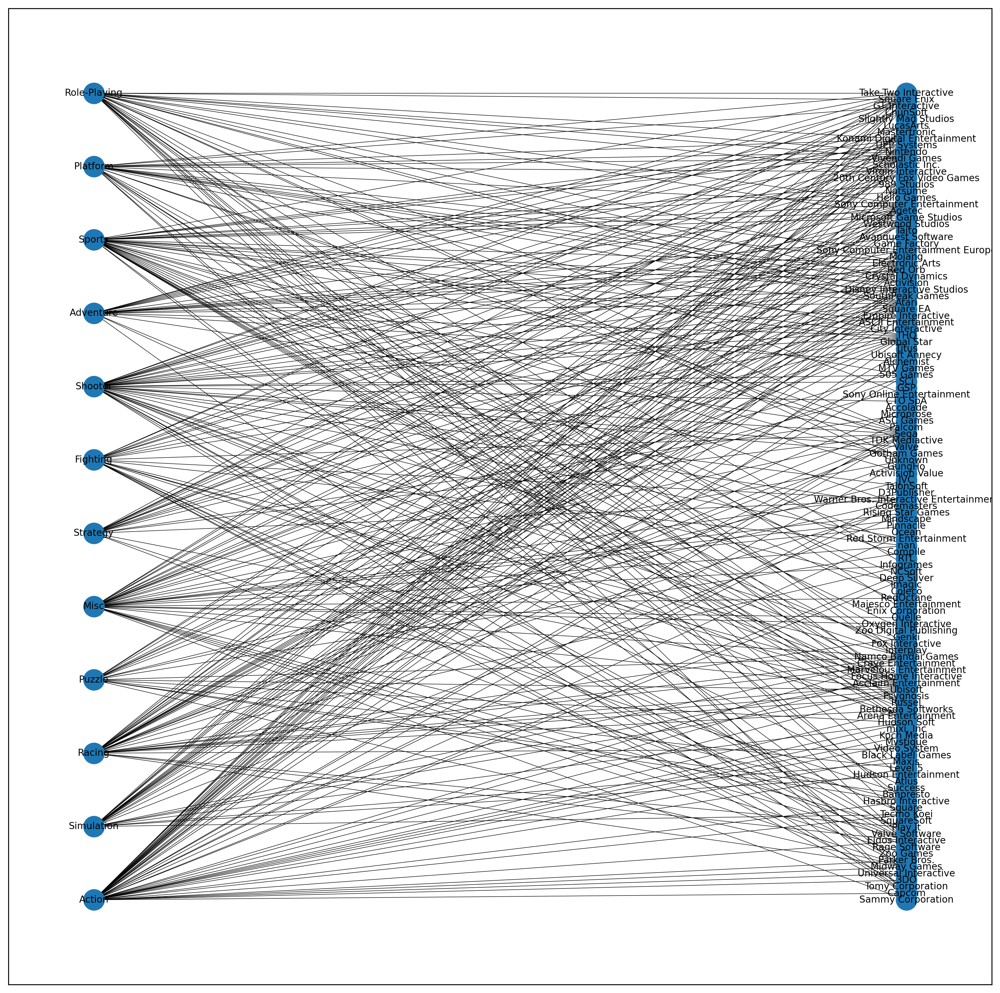

In [12]:
import matplotlib.pyplot as plt
plt.figure(figsize = (15, 15))
pos = nx.spring_layout(g_1)
fig, ax = plt.subplots(1, 1, figsize = (15, 15), dpi = 300)
nx.draw_networkx(g_1, pos = nx.drawing.layout.bipartite_layout(g_1, genres), font_size = 8, width = 0.4)

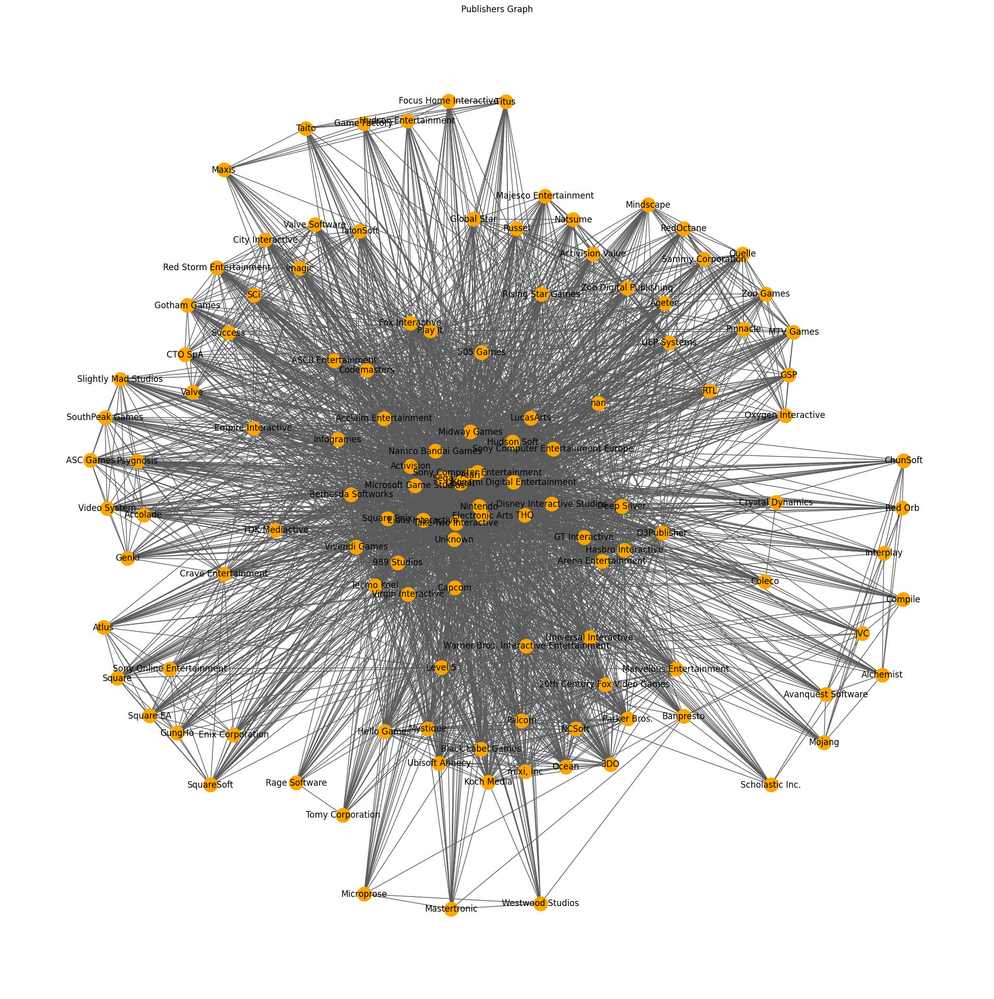

In [13]:
# Remove duplicated publishers from rows of dataframe:
final_publishers = publishers.drop_duplicates()
g_2 = bipartite.weighted_projected_graph(g_1, final_publishers)
plt.figure(figsize = (25, 25))

layout = nx.spring_layout(g_2)

nx.draw_networkx_nodes(
    g_2,
    layout,
    nodelist = final_publishers,
    node_size = 400,
    node_color = 'orange'
)
nx.draw_networkx_edges(g_2, layout, edge_color = '#5A5A5A')
node_labels = dict(zip(final_publishers, final_publishers))
nx.draw_networkx_labels(g_2, layout, labels = node_labels)
plt.axis('off')
plt.title('Publishers Graph')

plt.show()


Xuat do thi 1 phia ra Gephi

In [14]:
labels = nx.get_edge_attributes(g_2, 'weight')
df2 = pd.DataFrame(columns = ['source', 'target', 'weight'])
for key, value in labels.items():
    df2 = df2.append({'source': key[0], 'target': key[1], 'weight': value}, ignore_index = True)
# Export to .csv file to be used in Gephi
df2.to_csv('vgsales_gephi.csv', index = False, header = True)
# If this file is compiled with Google Colab please add '/' before the file name to get the 
# exported csv in the root directory as below:
# df2.to_csv('/vgsales_gephi.csv', index = False, header = True)

C:\Users\minh\AppData\Local\Temp\ipykernel_23084\566239561.py:4: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append({'source': key[0], 'target': key[1], 'weight': value}, ignore_index = True)
C:\Users\minh\AppData\Local\Temp\ipykernel_23084\566239561.py:4: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append({'source': key[0], 'target': key[1], 'weight': value}, ignore_index = True)
C:\Users\minh\AppData\Local\Temp\ipykernel_23084\566239561.py:4: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append({'source': key[0], 'target': key[1], 'weight': value}, ignore_index = True)
C:\Users\minh\AppData\Local\Temp\ipykernel_23084\566239561.py:4: FutureWarning: The frame.append method is deprecated and

Phat hien cong dong bang thuat toan Louvain

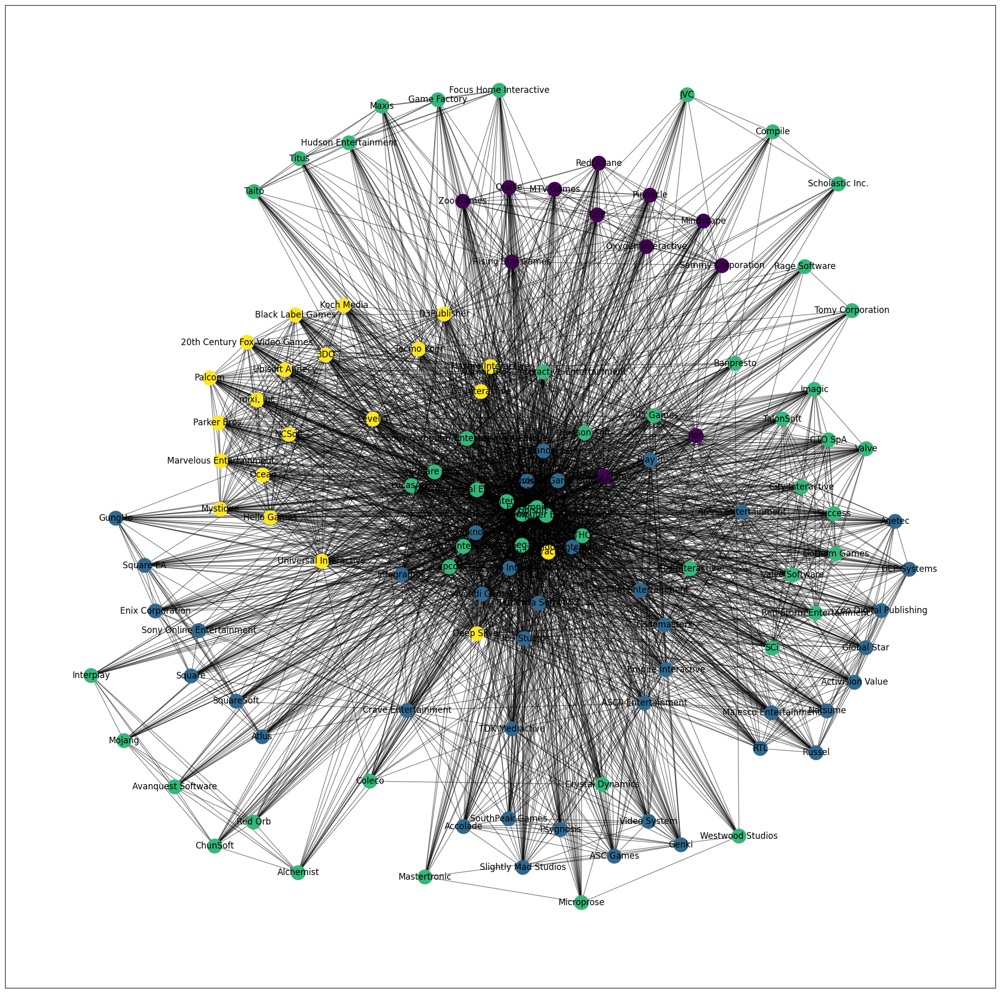

In [15]:
import matplotlib.cm as cm
import matplotlib
from community import community_louvain

plt.figure(figsize = (25, 25))

# Compute the best partition
partition = community_louvain.best_partition(g_2)

# Draw the graph
pos = nx.spring_layout(g_2)
# Color the nodes according to their partitions
cmap = cm.get_cmap('viridis', max(partition.values()) + 1)
nx.draw_networkx_nodes(g_2, pos, partition.keys(), node_size = 400, cmap = cmap, node_color = 
list(partition.values()))
nx.draw_networkx_edges(g_2, pos, alpha = 0.5)
nx.draw_networkx_labels(g_2, pos)

plt.show()

Liet ke cac cong dong

In [16]:
import numpy as np
values = list(partition.values())

# Print number of communities
print('Number of communities: ', len(np.unique(values)))

Number of communities:  4


In [17]:
for i in range(len(np.unique(values))):
    print("---------", "Community ", i + 1, "---------")
    print("")
    for name, k in partition.items():
        if k == i:
            print(name)
    print("")

--------- Community  1 ---------

RedOctane
MTV Games
nan
Midway Games
Mindscape
Oxygen Interactive
Rising Star Games
Zoo Games
GSP
Sammy Corporation
Pinnacle
Quelle

--------- Community  2 ---------

Microsoft Game Studios
Take-Two Interactive
Activision
Bethesda Softworks
SquareSoft
Eidos Interactive
Vivendi Games
Enix Corporation
Namco Bandai Games
Acclaim Entertainment
Majesco Entertainment
Codemasters
Arena Entertainment
989 Studios
UEP Systems
ASCII Entertainment
Infogrames
Unknown
Square
Activision Value
Video System
Global Star
GungHo
Crave Entertainment
Atlus
TDK Mediactive
ASC Games
Accolade
Sony Online Entertainment
RTL
Natsume
SouthPeak Games
Zoo Digital Publishing
Psygnosis
Empire Interactive
Russel
Agetec
Play It
Slightly Mad Studios
Genki
Square EA

--------- Community  3 ---------

Nintendo
Sony Computer Entertainment
Ubisoft
Electronic Arts
Sega
Atari
505 Games
Capcom
Konami Digital Entertainment
Sony Computer Entertainment Europe
Square Enix
LucasArts
Virgin Interacti